In [ ]:
##!pip install seaborn
##%pip install ydata-profiling
##%pip uninstall -y ydata-profiling
##%pip install -U "setuptools<81" "fg-data-profiling[notebook]"
#%pip install scikit-learn
#%pip install geopandas

In [ ]:
#! pip freeze > requirements.txt

# NYC Restaurant Inspection Risk Analysis

This notebook analyzes NYC restaurant inspection data to identify patterns associated with inspection risk and to classify inspections into three risk categories: Low, Moderate, and High.

The analysis covers data exploration, identification of gradable inspections, inspection-level aggregation, feature engineering, borough-level high-risk analysis, and a baseline classification model.

## 1. Project Setup

In [92]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns

from data_profiling import ProfileReport
from IPython.display import HTML, display
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

%matplotlib inline

## 2. Data Loading and Initial Exploration

In [93]:
URL = "https://data.cityofnewyork.us/resource/43nn-pn8j.csv?$limit=100000"
restaurant_df = pd.read_csv(URL)
restaurant_df.head()

,camis,dba,boro,building,street,zipcode,phone,cuisine_description,inspection_date,action,...,inspection_type,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta,location
0,50186486,OK CAFE,Queens,22-04,33 STREET,11105.0,3475450537,NaN,1900-01-01T00:00:00.000,NaN,...,NaN,40.775076,-73.909978,401.0,22.0,11500.0,4017064.0,4.008330e+09,QN72,POINT (-73.909978376241 40.775075611041)
1,50162632,GNOCCHI ON 9TH HS LLC,Manhattan,1,HERALD SQUARE,10001.0,2012745976,NaN,1900-01-01T00:00:00.000,NaN,...,NaN,40.750542,-73.987541,105.0,4.0,10900.0,1089436.0,1.008100e+09,MN17,POINT (-73.987541021756 40.750541907818)
2,50115885,PIZZA HUT 38746,0,760,FULTON AVE,11550.0,4692840850,NaN,1900-01-01T00:00:00.000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,50180370,PRODROMOS INC,Manhattan,536,3 AVENUE,10016.0,9299890558,NaN,1900-01-01T00:00:00.000,NaN,...,NaN,40.746805,-73.977343,106.0,4.0,8000.0,1018912.0,1.008910e+09,MN20,POINT (-73.977342682104 40.746804727136)
4,50188078,ADDAKHANA RESTAURANT & SWEETS INC.,Brooklyn,93,CHURCH AVENUE,11218.0,9298884565,NaN,1900-01-01T00:00:00.000,NaN,...,NaN,40.642649,-73.979800,312.0,39.0,49600.0,3124486.0,3.053320e+09,BK41,POINT (-73.979799635048 40.642649311526)


### 2.1 Raw Dataset EDA

I first examine the complete dataset to understand its structure, variables, missing values, and overall data quality before applying analytical filters.

In [94]:
restaurant_profile = ProfileReport(restaurant_df, title="Restaurant Data Profile Report",
                                    explorative=True)
restaurant_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 27/27 [00:07<00:00,  3.74it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [95]:
relevant_cols=['camis', 'dba', 'boro', 'inspection_date', 'action', 'violation_code',
       'violation_description', 'critical_flag', 'score', 'grade',
       'grade_date', 'inspection_type']
restaurant_relevant_df = restaurant_df.copy()
restaurant_relevant_df = restaurant_relevant_df[relevant_cols]
restaurant_relevant_df.head()

,camis,dba,boro,inspection_date,action,violation_code,violation_description,critical_flag,score,grade,grade_date,inspection_type
0,50186486,OK CAFE,Queens,1900-01-01T00:00:00.000,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN
1,50162632,GNOCCHI ON 9TH HS LLC,Manhattan,1900-01-01T00:00:00.000,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN
2,50115885,PIZZA HUT 38746,0,1900-01-01T00:00:00.000,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN
3,50180370,PRODROMOS INC,Manhattan,1900-01-01T00:00:00.000,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN
4,50188078,ADDAKHANA RESTAURANT & SWEETS INC.,Brooklyn,1900-01-01T00:00:00.000,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN


### 2.2 Gradable Inspections EDA

Not every inspection in the raw dataset can be assigned a risk category. I therefore filter the data to inspections that meet the criteria for a gradable inspection and profile this analytical population separately.

This allows me to understand the population used for the subsequent analysis and modeling.

In [96]:
# Gradable inspection types
gradable_insp_type = [
    "Cycle Inspection / Initial Inspection",
    "Cycle Inspection / Re-inspection",
    "Pre-permit (Operational) / Initial Inspection",
    "Pre-permit (Operational) / Re-inspection"
]

# Gradable actions
gradable_action = ["Violations were cited in the following area(s).",
                     "No violations were recorded at the time of this inspection.",
                     "Establishment Closed by DOHMH.Violations were cited in the following area(s) and those requiring immediate action were addressed."]

# Make sure inspection_date is a datetime
restaurant_relevant_df["inspection_date"] = pd.to_datetime(
    restaurant_relevant_df["inspection_date"],
    errors="coerce"
)

# Filter for gradable inspections
gradable_records_df = restaurant_relevant_df[
    restaurant_relevant_df["inspection_type"].isin(gradable_insp_type)
    & restaurant_relevant_df["action"].isin(gradable_action)
    & (restaurant_relevant_df["inspection_date"] >= pd.Timestamp("2010-07-27"))
].copy()

gradable_records_df.head()

,camis,dba,boro,inspection_date,action,violation_code,violation_description,critical_flag,score,grade,grade_date,inspection_type
7,50099561,SOPHRA GRILL,Manhattan,2024-02-28,Violations were cited in the following area(s).,09B,Thawing procedure improper.,Not Critical,11.0,A,2024-02-28T00:00:00.000,Cycle Inspection / Re-inspection
8,41585425,LUCKY GARDEN,Bronx,2024-04-03,Violations were cited in the following area(s).,04L,Evidence of mice or live mice in establishment...,Critical,31.0,NaN,NaN,Cycle Inspection / Initial Inspection
16,50116168,SAUCE PIZZERIA,0,2023-07-14,Violations were cited in the following area(s).,02B,Hot TCS food item not held at or above 140 °F.,Critical,15.0,B,2023-07-14T00:00:00.000,Pre-permit (Operational) / Re-inspection
18,50105605,LALIBELA ETHIOPIAN RESTAURANT,Manhattan,2023-04-05,Violations were cited in the following area(s).,04A,Food Protection Certificate (FPC) not held by ...,Critical,32.0,NaN,NaN,Cycle Inspection / Initial Inspection
29,41685800,OLMSTED CAFETERIA- KIOSK,Queens,2025-08-13,Violations were cited in the following area(s).,09B,Thawing procedure improper.,Not Critical,13.0,A,2025-08-13T00:00:00.000,Cycle Inspection / Re-inspection


In [97]:
gradable_records_profile = ProfileReport(gradable_records_df, title="Gradable Records Data Profile Report",
                                    explorative=True)
gradable_records_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:02<00:00,  5.56it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [98]:
gradable_records_df["grade"].value_counts(dropna=False)

grade
NaN    38688
A      32897
B       6133
C       4402
N       2773
Z       1500
Name: count, dtype: int64

In [99]:
gradable_records_df.groupby(
    ["inspection_date", "camis"]
).agg(
    score=("score", "first"),
    grade=("grade", "first"),
    violations=("violation_code", "count")
).head(20)

,,score,grade,violations
inspection_date,camis,,,
2011-06-16,41331528,20.0,None,2
2012-01-20,41331528,18.0,None,2
2014-03-06,50003303,5.0,None,1
2014-04-21,50003303,10.0,A,1
2014-10-30,50003303,43.0,C,3
2015-10-14,40944945,5.0,A,1
2015-11-16,40366929,23.0,None,2
2015-11-19,50015538,12.0,A,1
2015-12-12,41611709,21.0,None,1


In [100]:
gradable_records_df.groupby(
    ["camis", "inspection_date"]
)["inspection_type"].nunique().sort_values(ascending=False).head()

camis     inspection_date
30075445  2023-08-01         1
          2026-02-27         1
30191841  2024-11-20         1
          2025-02-20         1
          2026-07-30         1
Name: inspection_type, dtype: int64

## 3. Data Preparation & Target Definition

In [101]:
# What's the relationship between grade and score? Let's look at the distribution of grades by score.
gradable_records_df.groupby("grade")["score"].describe()

,count,mean,std,min,25%,50%,75%,max
grade,,,,,,,,
A,32897.0,10.212968,2.966455,0.0,9.0,11.0,12.0,43.0
B,6133.0,22.341595,3.901414,0.0,20.0,23.0,26.0,66.0
C,4402.0,42.721263,12.634579,21.0,33.0,40.0,49.0,154.0
N,2773.0,32.078255,14.604231,0.0,22.0,27.0,39.0,117.0
Z,1500.0,34.494667,14.803380,6.0,24.0,29.0,42.0,108.0


In [102]:
gradable_records_df["grade"].value_counts(dropna=False)

grade
NaN    38688
A      32897
B       6133
C       4402
N       2773
Z       1500
Name: count, dtype: int64

In [103]:
risk_mapping = {
    "A": "Low",
    "B": "Moderate",
    "C": "High"
}
gradable_records_df["risk_category"] = (
    gradable_records_df["grade"].map(risk_mapping)
)

In [104]:
modeling_df = gradable_records_df[
    gradable_records_df["grade"].isin(["A", "B", "C"])
].copy()
display(modeling_df.head())
modeling_df["grade"].value_counts()

,camis,dba,boro,inspection_date,action,violation_code,violation_description,critical_flag,score,grade,grade_date,inspection_type,risk_category
7,50099561,SOPHRA GRILL,Manhattan,2024-02-28,Violations were cited in the following area(s).,09B,Thawing procedure improper.,Not Critical,11.0,A,2024-02-28T00:00:00.000,Cycle Inspection / Re-inspection,Low
16,50116168,SAUCE PIZZERIA,0,2023-07-14,Violations were cited in the following area(s).,02B,Hot TCS food item not held at or above 140 °F.,Critical,15.0,B,2023-07-14T00:00:00.000,Pre-permit (Operational) / Re-inspection,Moderate
29,41685800,OLMSTED CAFETERIA- KIOSK,Queens,2025-08-13,Violations were cited in the following area(s).,09B,Thawing procedure improper.,Not Critical,13.0,A,2025-08-13T00:00:00.000,Cycle Inspection / Re-inspection,Low
34,50056951,NEUBERGER BERMAN CAFE,Manhattan,2026-04-27,Violations were cited in the following area(s).,02B,Hot TCS food item not held at or above 140 °F.,Critical,11.0,A,2026-04-27T00:00:00.000,Cycle Inspection / Initial Inspection,Low
48,50002484,ALKE CAFE,Manhattan,2025-11-08,Violations were cited in the following area(s).,02B,Hot TCS food item not held at or above 140 °F.,Critical,12.0,A,2025-11-08T00:00:00.000,Cycle Inspection / Initial Inspection,Low


grade
A    32897
B     6133
C     4402
Name: count, dtype: int64

## 4. Inspection-Level Aggregation

Each inspection can contain multiple rows because the source data is recorded at the violation level. For modeling, I need one observation per inspection rather than one observation per violation.

I therefore aggregate records by restaurant (`camis`) and inspection date. This produces one row per inspection while preserving the inspection-level target and summary measures such as violation count and critical violation count.

In [105]:
# How many violations belong to each inspection?
inspection_counts = (
    modeling_df
    .groupby(["camis", "inspection_date"])
    .size()
)

inspection_counts.describe()

count    30812.000000
mean         1.409581
std          0.697112
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          8.000000
dtype: float64

In [106]:
inspection_counts.value_counts().sort_index()

1    21021
2     7655
3     1620
4      387
5       92
6       29
7        5
8        3
Name: count, dtype: int64

In [107]:
inspection_counts.shape

(30812,)

In [108]:
# Aggregate the infromation needed for each inspection into a single row
inspection_df = (
    modeling_df
    .groupby(["camis", "inspection_date"])
    .agg(
        boro=("boro", "first"),
        grade=("grade", "first"),
        risk_category=("risk_category", "first"),
        violation_count=("violation_code", "count"),
        critical_count=("critical_flag", lambda x: (x == "Critical").sum())
    )
    .reset_index()
)
inspection_df.head()


,camis,inspection_date,boro,grade,risk_category,violation_count,critical_count
0,30075445,2026-02-27,Bronx,A,Low,1,0
1,30191841,2025-02-20,Manhattan,A,Low,1,1
2,30191841,2026-07-30,Manhattan,A,Low,1,1
3,40356483,2024-04-23,Brooklyn,B,Moderate,1,0
4,40356483,2025-01-06,Brooklyn,A,Low,2,2


In [109]:
inspection_df.shape

(30812, 7)

In [110]:
inspection_df["risk_category"].value_counts()

risk_category
Low         25498
Moderate     3489
High         1825
Name: count, dtype: int64

In [111]:
inspection_df["camis"].nunique()

20028

In [112]:
inspection_df.duplicated(
    ["camis", "inspection_date"]
).sum()

np.int64(0)

## 5. Feature Engineering

### 5.1 Violation features

In [113]:
violation_features_df = (
    modeling_df
    .groupby(["camis", "inspection_date"])["violation_code"]
    .value_counts()
    .unstack(fill_value=0)
)
violation_features_df = violation_features_df.reset_index()
violation_features_df.head()

violation_code,camis,inspection_date,02A,02B,02C,02D,02F,02G,02H,02I,...,10D,10E,10F,10G,10H,10I,10J,28-05,28-06,28-07
0,30075445,2026-02-27,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,30191841,2025-02-20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,30191841,2026-07-30,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,40356483,2024-04-23,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,40356483,2025-01-06,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Handling Missing Violation Features

Violation features are created from the violation-level records and then merged back to the inspection-level dataset.

Some inspections have no violation-code records because no violations were recorded. I investigate these missing values before deciding how they should be represented in the modeling dataset.

In [114]:
merged_df = inspection_df.merge(
    violation_features_df,
    on=["camis", "inspection_date"],
    how="left"
)

no_violation_keys = merged_df.loc[
    merged_df["02A"].isna(),
    ["camis", "inspection_date"]
]

no_violation_actions = modeling_df.merge(
    no_violation_keys,
    on=["camis", "inspection_date"],
    how="inner"
)

no_violation_actions["action"].value_counts()

action
No violations were recorded at the time of this inspection.    130
Violations were cited in the following area(s).                  1
Name: count, dtype: int64

In [115]:
different_action = no_violation_actions[
    no_violation_actions["action"] != "No violations were recorded at the time of this inspection."
]

different_action[["camis", "inspection_date", "action"]]

,camis,inspection_date,action
28,50137520,2023-08-08,Violations were cited in the following area(s).


In [119]:
modeling_df[
    (modeling_df["action"] == "Violations were cited in the following area(s).") &
    (modeling_df["violation_code"].isna())
]

,camis,dba,boro,inspection_date,action,violation_code,violation_description,critical_flag,score,grade,grade_date,inspection_type,risk_category
9603,50137520,CAFETERIA MAESTRO,Brooklyn,2023-08-08,Violations were cited in the following area(s).,NaN,NaN,Not Applicable,0.0,A,2023-08-08T00:00:00.000,Pre-permit (Operational) / Initial Inspection,Low


One additional inspection has no violation code despite an action indicating that violations were cited. I treat this as a data-quality anomaly and retain the inspection with zero observed violation-code features.

In [120]:
modeling_inspection_df = inspection_df.merge(
    violation_features_df,
    on=["camis", "inspection_date"],
    how="left"
)

modeling_inspection_df.shape

(30812, 69)

In [121]:
violation_columns = violation_features_df.columns.difference(
    ["camis", "inspection_date"]
)
len(violation_columns)

62

In [122]:
modeling_inspection_df[violation_columns] = (
    modeling_inspection_df[violation_columns].fillna(0)
)

In [123]:
modeling_inspection_df[violation_columns].isna().sum().sum()

np.int64(0)

In [124]:
modeling_inspection_df.shape

(30812, 69)

In [125]:
modeling_inspection_df[
    ["camis", "inspection_date", "violation_count"]
    + list(violation_columns)
].head(20)

,camis,inspection_date,violation_count,02A,02B,02C,02D,02F,02G,02H,...,10D,10E,10F,10G,10H,10I,10J,28-05,28-06,28-07
0,30075445,2026-02-27,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,30191841,2025-02-20,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,30191841,2026-07-30,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,40356483,2024-04-23,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,40356483,2025-01-06,2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,40356731,2024-04-08,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,40356731,2025-04-30,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,40356731,2026-06-25,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,40357217,2024-05-21,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,40357217,2025-10-20,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
modeling_inspection_df.columns.tolist()

['camis',
 'inspection_date',
 'boro',
 'grade',
 'risk_category',
 'violation_count',
 'critical_count',
 '02A',
 '02B',
 '02C',
 '02D',
 '02F',
 '02G',
 '02H',
 '02I',
 '03A',
 '03B',
 '03C',
 '03I',
 '04A',
 '04C',
 '04D',
 '04E',
 '04F',
 '04H',
 '04J',
 '04K',
 '04L',
 '04M',
 '04N',
 '04O',
 '04P',
 '05A',
 '05B',
 '05C',
 '05D',
 '05E',
 '05F',
 '05H',
 '06A',
 '06B',
 '06C',
 '06D',
 '06E',
 '06F',
 '06G',
 '06H',
 '07A',
 '08A',
 '08B',
 '08C',
 '09A',
 '09B',
 '09C',
 '09D',
 '09E',
 '10A',
 '10B',
 '10C',
 '10D',
 '10E',
 '10F',
 '10G',
 '10H',
 '10I',
 '10J',
 '28-05',
 '28-06',
 '28-07']

### 5.2 Borough features
Borough is a categorical variable, so I represent it using one-hot encoding rather than numerical codes. This creates a separate binary feature for each observed borough category.

In [129]:
modeling_inspection_df["boro"].value_counts(dropna=False)

boro
Manhattan        11666
Brooklyn          7805
Queens            7246
Bronx             3004
Staten Island     1056
0                   35
Name: count, dtype: int64

#### Borough Data Quality Check

The borough field contains 35 records coded as `"0"` rather than one of the five NYC borough names.

I inspect these records separately because borough is used both for geographic analysis and as a model feature. These records are excluded from the borough-level geographic analysis but retained in the modeling dataset as a separate categorical value.

In [166]:
modeling_inspection_df[
    modeling_inspection_df["boro"] == "0"
][
    ["camis", "inspection_date", "boro", "risk_category"]
].head(20)

,camis,inspection_date,boro,risk_category
1872,40808118,2023-10-03,0,High
1873,40808118,2025-10-08,0,Moderate
7129,41654607,2023-03-24,0,Moderate
8854,50006236,2023-01-17,0,Low
11287,50045850,2025-06-11,0,Low
11288,50045852,2023-04-18,0,Low
13479,50067635,2025-08-20,0,Moderate
13840,50070626,2023-06-01,0,Low
14489,50075248,2022-11-30,0,High
14490,50075248,2024-01-03,0,Low


In [169]:
modeling_inspection_df[
    modeling_inspection_df["boro"] == "0"
]["risk_category"].value_counts()

risk_category
Low         27
Moderate     5
High         3
Name: count, dtype: int64

Borough is converted into one-hot encoded features so that the model can use borough information without imposing an artificial numerical ordering.

In [168]:
boro_features_df = pd.get_dummies(
    modeling_inspection_df["boro"],
    prefix="boro",
    dtype=int
)

modeling_inspection_df = pd.concat(
    [modeling_inspection_df, boro_features_df],
    axis=1
)

In [167]:
# Validate that each row represents a unique inspection
modeling_inspection_df[
    ["camis", "inspection_date"]
].duplicated().sum()

np.int64(0)

### 5.3 Month features

In [141]:
modeling_inspection_df["inspection_month"] = (
    pd.to_datetime(modeling_inspection_df["inspection_date"]).dt.month
)
modeling_inspection_df.head()

,camis,inspection_date,boro,grade,risk_category,violation_count,critical_count,02A,02B,02C,...,28-06,28-07,boro_code,boro_0,boro_Bronx,boro_Brooklyn,boro_Manhattan,boro_Queens,boro_Staten Island,inspection_month
0,30075445,2026-02-27,Bronx,A,Low,1,0,0.0,0.0,0.0,...,0.0,0.0,2.0,0,1,0,0,0,0,2
1,30191841,2025-02-20,Manhattan,A,Low,1,1,0.0,0.0,0.0,...,0.0,0.0,1.0,0,0,0,1,0,0,2
2,30191841,2026-07-30,Manhattan,A,Low,1,1,0.0,0.0,0.0,...,0.0,0.0,1.0,0,0,0,1,0,0,7
3,40356483,2024-04-23,Brooklyn,B,Moderate,1,0,0.0,0.0,0.0,...,0.0,0.0,3.0,0,0,1,0,0,0,4
4,40356483,2025-01-06,Brooklyn,A,Low,2,2,0.0,0.0,0.0,...,0.0,0.0,3.0,0,0,1,0,0,0,1


In [142]:
month_features_df = pd.get_dummies(
    modeling_inspection_df["inspection_month"],
    prefix="month",
    dtype=int
)

modeling_inspection_df = pd.concat(
    [modeling_inspection_df, month_features_df],
    axis=1
)

modeling_inspection_df.head()

,camis,inspection_date,boro,grade,risk_category,violation_count,critical_count,02A,02B,02C,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,30075445,2026-02-27,Bronx,A,Low,1,0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,30191841,2025-02-20,Manhattan,A,Low,1,1,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,30191841,2026-07-30,Manhattan,A,Low,1,1,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0
3,40356483,2024-04-23,Brooklyn,B,Moderate,1,0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
4,40356483,2025-01-06,Brooklyn,A,Low,2,2,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [143]:
modeling_inspection_df.shape

(30812, 89)

In [144]:
modeling_inspection_df.columns.tolist()

['camis',
 'inspection_date',
 'boro',
 'grade',
 'risk_category',
 'violation_count',
 'critical_count',
 '02A',
 '02B',
 '02C',
 '02D',
 '02F',
 '02G',
 '02H',
 '02I',
 '03A',
 '03B',
 '03C',
 '03I',
 '04A',
 '04C',
 '04D',
 '04E',
 '04F',
 '04H',
 '04J',
 '04K',
 '04L',
 '04M',
 '04N',
 '04O',
 '04P',
 '05A',
 '05B',
 '05C',
 '05D',
 '05E',
 '05F',
 '05H',
 '06A',
 '06B',
 '06C',
 '06D',
 '06E',
 '06F',
 '06G',
 '06H',
 '07A',
 '08A',
 '08B',
 '08C',
 '09A',
 '09B',
 '09C',
 '09D',
 '09E',
 '10A',
 '10B',
 '10C',
 '10D',
 '10E',
 '10F',
 '10G',
 '10H',
 '10I',
 '10J',
 '28-05',
 '28-06',
 '28-07',
 'boro_code',
 'boro_0',
 'boro_Bronx',
 'boro_Brooklyn',
 'boro_Manhattan',
 'boro_Queens',
 'boro_Staten Island',
 'inspection_month',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12']

## 6. Borough-level High-Risk Analysis

In [145]:
borough_analysis_df = modeling_inspection_df[
    modeling_inspection_df["boro"] != "0"
].copy()

borough_summary = (
    borough_analysis_df
    .groupby("boro")
    .agg(
        inspections=("risk_category", "size"),
        high_risk_inspections=("risk_category", lambda x: (x == "High").sum())
    )
)

borough_summary["high_risk_rate"] = (
    borough_summary["high_risk_inspections"]
    / borough_summary["inspections"]
)

borough_summary = borough_summary.sort_values(
    "high_risk_rate",
    ascending=False
)

borough_summary

,inspections,high_risk_inspections,high_risk_rate
boro,,,
Queens,7246,525,0.072454
Brooklyn,7805,451,0.057783
Manhattan,11666,640,0.054860
Bronx,3004,164,0.054594
Staten Island,1056,42,0.039773


In [146]:
borough_summary["high_risk_rate_pct"] = (
    borough_summary["high_risk_rate"] * 100
).round(2)

borough_summary

,inspections,high_risk_inspections,high_risk_rate,high_risk_rate_pct
boro,,,,
Queens,7246,525,0.072454,7.25
Brooklyn,7805,451,0.057783,5.78
Manhattan,11666,640,0.054860,5.49
Bronx,3004,164,0.054594,5.46
Staten Island,1056,42,0.039773,3.98


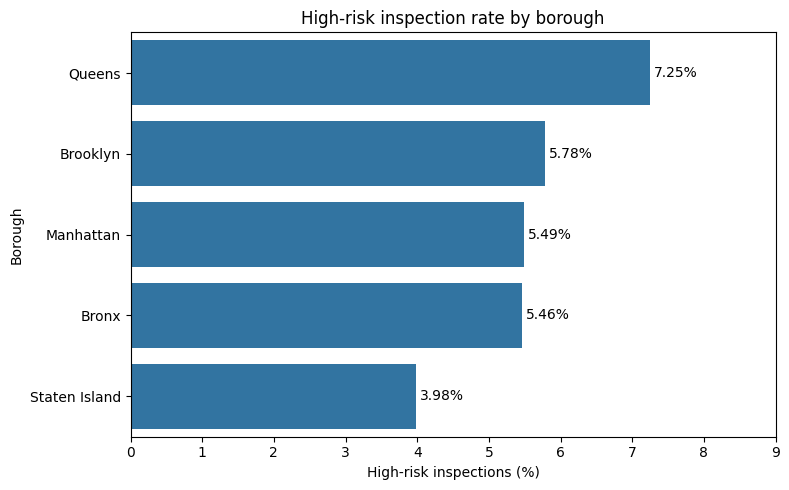

In [147]:
plt.figure(figsize=(8, 5))

ax = sns.barplot(
    data=borough_summary.reset_index(),
    x="high_risk_rate_pct",
    y="boro"
)

plt.xlabel("High-risk inspections (%)")
plt.ylabel("Borough")
plt.title("High-risk inspection rate by borough")

for container in ax.containers:
    ax.bar_label(container, fmt="%.2f%%", padding=3)

plt.xlim(0, 9)
plt.tight_layout()
plt.show()

In [148]:
borough_url = (
    "https://data.cityofnewyork.us/api/v3/views/"
    "gthc-hcne/query.geojson?accessType=DOWNLOAD"
)

response = requests.get(borough_url)

print("Status code:", response.status_code)

Status code: 200


In [149]:
boroughs = gpd.GeoDataFrame.from_features(
    response.json()["features"]
)

boroughs.head()

,geometry,:id,:version,:created_at,:updated_at,borocode,boroname,shape_area,shape_leng
0,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ...",row-7tjt.uvyw.7ibt,rv-4t64_6m9c_35an,2026-05-26T19:35:49.449Z,2026-05-26T19:35:49.449Z,5,Staten Island,1623618358.46,325912.288988
1,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ...",row-j4kv.jskm_sgt9,rv-86hu-khv5~6gub,2026-05-26T19:35:49.449Z,2026-05-26T19:35:49.449Z,3,Brooklyn,1934462607.75,726953.04509
2,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ...",row-fmcn_egr2.4ed7,rv-fzx7_87v2_ghcm,2026-05-26T19:35:49.449Z,2026-05-26T19:35:49.449Z,4,Queens,3041419716.32,887902.903727
3,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",row-sgcq-gqfx_iqid,rv-n78r-xzdj~m3tb,2026-05-26T19:35:49.449Z,2026-05-26T19:35:49.449Z,1,Manhattan,636631537.285,359537.906171
4,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ...",row-xiai_c2ui_hanx,rv-4ed5_kbz3-4cqg,2026-05-26T19:35:49.449Z,2026-05-26T19:35:49.449Z,2,Bronx,1187199168.58,463146.326689


In [150]:
print("Geographic boroughs:")
print(boroughs["boroname"].tolist())

print("\nAnalytical boroughs:")
print(borough_summary.index.tolist())


Geographic boroughs:
['Staten Island', 'Brooklyn', 'Queens', 'Manhattan', 'Bronx']

Analytical boroughs:
['Queens', 'Brooklyn', 'Manhattan', 'Bronx', 'Staten Island']


In [151]:
borough_summary_map = borough_summary.reset_index()

In [152]:
borough_map = boroughs.merge(
    borough_summary_map,
    left_on="boroname",
    right_on="boro",
    how="left"
)

In [153]:
borough_map[
    ["boroname", "inspections", "high_risk_inspections", "high_risk_rate_pct"]
]

,boroname,inspections,high_risk_inspections,high_risk_rate_pct
0,Staten Island,1056,42,3.98
1,Brooklyn,7805,451,5.78
2,Queens,7246,525,7.25
3,Manhattan,11666,640,5.49
4,Bronx,3004,164,5.46


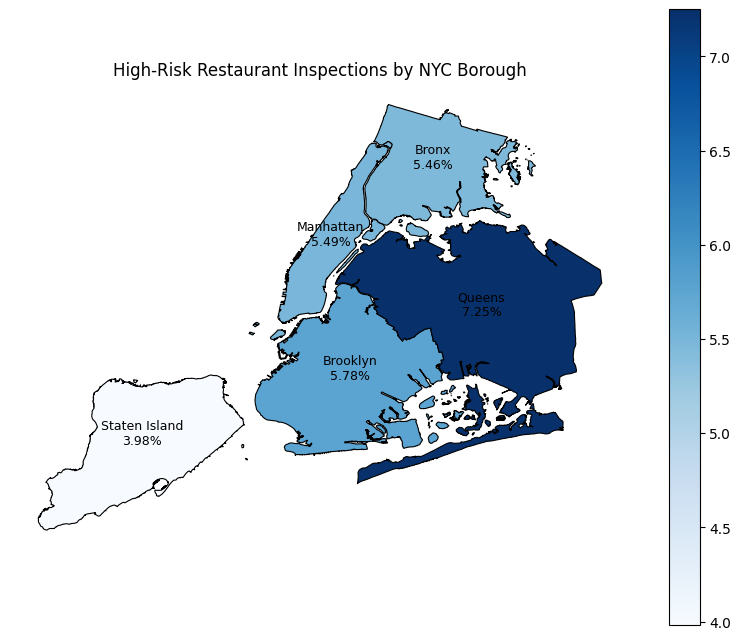

In [154]:
fig, ax = plt.subplots(figsize=(10, 8))

borough_map.plot(
    column="high_risk_rate_pct",
    ax=ax,
    legend=True,
    cmap="Blues",
    edgecolor="black",
    linewidth=0.8
)

for _, row in borough_map.iterrows():
    x, y = row.geometry.centroid.x, row.geometry.centroid.y
    
    ax.text(
        x,
        y,
        f"{row['boroname']}\n{row['high_risk_rate_pct']:.2f}%",
        ha="center",
        fontsize=9
    )

ax.set_title("High-Risk Restaurant Inspections by NYC Borough")
ax.axis("off")

plt.show()

## 7. Baseline Model and Evaluation

### Feature and Target Selection

The target variable is `risk_category`, derived from the inspection grade. The original `grade` is excluded from the features because it directly defines the target and would cause target leakage.

Identifiers and raw fields that are not used as model inputs are also excluded:
- `camis` identifies the restaurant but is not an analytical feature.
- `inspection_date` is retained for analysis but not used directly as a model feature.
- `boro` is excluded after its information has been represented through one-hot encoded borough features.
- `inspection_month` is excluded because its information is represented through the one-hot encoded month features.

The remaining variables form the feature matrix `X`, while `risk_category` forms the target vector `y`.

In [ ]:
X = modeling_inspection_df.drop(
    columns=[
        "risk_category",
        "grade",
        "camis",
        "inspection_date",
        "boro",
        "inspection_month"
    ]
)

y = modeling_inspection_df["risk_category"]

In [156]:
print("X shape:", X.shape)
print("y shape:", y.shape)

print("\nMissing values in X:", X.isna().sum().sum())
print("Missing values in y:", y.isna().sum())

print("\nTarget distribution:")
print(y.value_counts())
print(y.value_counts(normalize=True))

print("\nX data types:")
print(X.dtypes.value_counts())

X shape: (30812, 82)
y shape: (30812,)

Missing values in X: 0
Missing values in y: 0

Target distribution:
risk_category
Low         25498
Moderate     3489
High         1825
Name: count, dtype: int64
risk_category
Low         0.827535
Moderate    0.113235
High        0.059230
Name: proportion, dtype: float64

X data types:
float64    62
int64      20
Name: count, dtype: int64


In [ ]:
print([
    col for col in [
        "risk_category",
        "grade",
        "camis",
        "inspection_date",
        "boro",
        "inspection_month"
    ]
    if col in X.columns
])

[]


### 7.1 Train/Test Split

In [158]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [159]:
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

print("\nTrain target distribution:")
print(y_train.value_counts(normalize=True))

print("\nTest target distribution:")
print(y_test.value_counts(normalize=True))

X_train: (24649, 82)
X_test: (6163, 82)
y_train: (24649,)
y_test: (6163,)

Train target distribution:
risk_category
Low         0.827539
Moderate    0.113230
High        0.059232
Name: proportion, dtype: float64

Test target distribution:
risk_category
Low         0.827519
Moderate    0.113257
High        0.059224
Name: proportion, dtype: float64


### 7.2 Baseline Model - Logistic Regression

In [160]:
baseline_model = LogisticRegression(
    class_weight="balanced",
    max_iter=1000,
    random_state=42
)

baseline_model.fit(X_train, y_train)



,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",'balanced'
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary <random_state>` for details.",42
,"max_iter max_iter: int, default=100Maximum number of iterations taken for the solvers to converge.",1000
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add an L2 penalty term and it is the default choice;- `'l1'`: add an L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` and `C` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'`, `l1_ratio` set to any float between 0 and 1 for `penalty='elasticnet'`, and `C=np.inf` for `penalty=None`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation <regularized-logistic-loss>`) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default 

### 7.3 Model Evaluation

In [161]:
y_pred = baseline_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)

macro_f1 = f1_score(
    y_test,
    y_pred,
    average="macro"
)

print("Baseline Logistic Regression")
print("-" * 35)
print("Accuracy:", accuracy)
print("Macro-F1:", macro_f1)

print("\nClassification report:")
print(classification_report(y_test, y_pred))

print("Confusion matrix:")
print(confusion_matrix(y_test, y_pred))

Baseline Logistic Regression
-----------------------------------
Accuracy: 0.6707772188869058
Macro-F1: 0.48535908974540615

Classification report:
              precision    recall  f1-score   support

        High       0.27      0.53      0.35       365
         Low       0.94      0.71      0.81      5100
    Moderate       0.21      0.49      0.30       698

    accuracy                           0.67      6163
   macro avg       0.47      0.57      0.49      6163
weighted avg       0.82      0.67      0.72      6163

Confusion matrix:
[[ 192   64  109]
 [ 348 3600 1152]
 [ 182  174  342]]


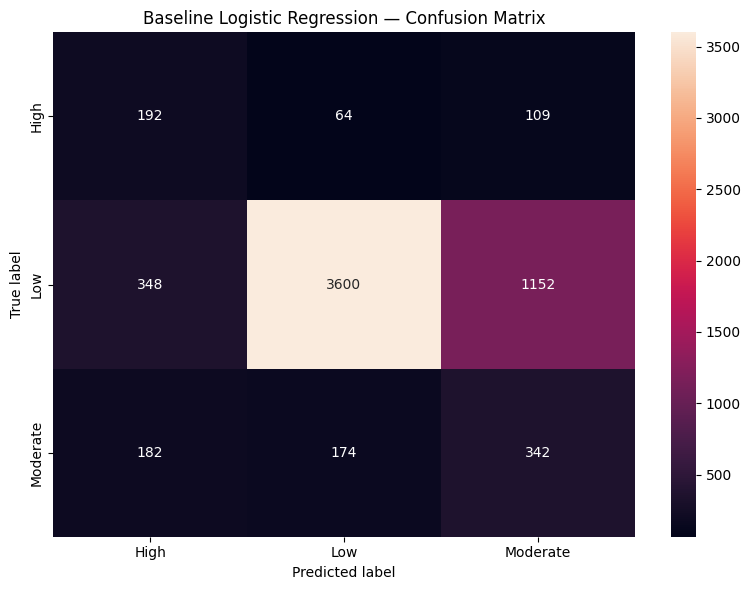

In [162]:
cm = confusion_matrix(y_test, y_pred, labels=baseline_model.classes_)

plt.figure(figsize=(8, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=baseline_model.classes_,
    yticklabels=baseline_model.classes_
)

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Baseline Logistic Regression — Confusion Matrix")

plt.tight_layout()
plt.show()

### 7.4 Model Interpretation

In [163]:
print("Coefficient shape:", baseline_model.coef_.shape)
print("Classes:", baseline_model.classes_)
print("Number of features:", len(X.columns))

coef_df = pd.DataFrame(
    baseline_model.coef_,
    index=baseline_model.classes_,
    columns=X.columns
)

Coefficient shape: (3, 82)
Classes: ['High' 'Low' 'Moderate']
Number of features: 82


In [164]:
high_coef = coef_df.loc["High"].sort_values(ascending=False)

print("Top features associated with High risk:")
print(high_coef.head(15))

Top features associated with High risk:
05E                1.928437
05H                1.553186
05F                1.323479
05A                1.209264
04P                1.002142
05C                0.900870
04F                0.885843
07A                0.862330
critical_count     0.831782
06G                0.539443
28-07              0.490792
05D                0.482499
03I                0.467377
violation_count    0.464361
09D                0.433968
Name: High, dtype: float64


In [165]:
violation_codes = [
    col for col in X.columns
    if col[0].isdigit()
]

high_violation_coef = (
    coef_df.loc["High", violation_codes]
    .sort_values(ascending=False)
)

print("Top violation codes associated with High risk:")
print(high_violation_coef.head(15))

Top violation codes associated with High risk:
05E      1.928437
05H      1.553186
05F      1.323479
05A      1.209264
04P      1.002142
05C      0.900870
04F      0.885843
07A      0.862330
06G      0.539443
28-07    0.490792
05D      0.482499
03I      0.467377
09D      0.433968
02A      0.431076
08A      0.360243
Name: High, dtype: float64
